In [50]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
%matplotlib inline

In [2]:
df = pd.read_csv('FitBit data.csv')

In [3]:
df.head()

,Id,ActivityDate,TotalSteps,TotalDistance,TrackerDistance,LoggedActivitiesDistance,VeryActiveDistance,ModeratelyActiveDistance,LightActiveDistance,SedentaryActiveDistance,VeryActiveMinutes,FairlyActiveMinutes,LightlyActiveMinutes,SedentaryMinutes,Calories
0,1503960366,3/25/2016,11004,7.11,7.11,0.0,2.57,0.46,4.07,0.0,33,12,205,804,1819
1,1503960366,3/26/2016,17609,11.55,11.55,0.0,6.92,0.73,3.91,0.0,89,17,274,588,2154
2,1503960366,3/27/2016,12736,8.53,8.53,0.0,4.66,0.16,3.71,0.0,56,5,268,605,1944
3,1503960366,3/28/2016,13231,8.93,8.93,0.0,3.19,0.79,4.95,0.0,39,20,224,1080,1932
4,1503960366,3/29/2016,12041,7.85,7.85,0.0,2.16,1.09,4.61,0.0,28,28,243,763,1886


In [4]:
import pandas_profiling

In [5]:
df.profile_report()

Summarize dataset:   0%|          | 0/29 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [6]:
df.shape

(457, 15)

In [7]:
df.isnull().sum() # No null values found

Id                          0
ActivityDate                0
TotalSteps                  0
TotalDistance               0
TrackerDistance             0
LoggedActivitiesDistance    0
VeryActiveDistance          0
ModeratelyActiveDistance    0
LightActiveDistance         0
SedentaryActiveDistance     0
VeryActiveMinutes           0
FairlyActiveMinutes         0
LightlyActiveMinutes        0
SedentaryMinutes            0
Calories                    0
dtype: int64

In [8]:
df1 = df.copy()

In [9]:
df1.head()

,Id,ActivityDate,TotalSteps,TotalDistance,TrackerDistance,LoggedActivitiesDistance,VeryActiveDistance,ModeratelyActiveDistance,LightActiveDistance,SedentaryActiveDistance,VeryActiveMinutes,FairlyActiveMinutes,LightlyActiveMinutes,SedentaryMinutes,Calories
0,1503960366,3/25/2016,11004,7.11,7.11,0.0,2.57,0.46,4.07,0.0,33,12,205,804,1819
1,1503960366,3/26/2016,17609,11.55,11.55,0.0,6.92,0.73,3.91,0.0,89,17,274,588,2154
2,1503960366,3/27/2016,12736,8.53,8.53,0.0,4.66,0.16,3.71,0.0,56,5,268,605,1944
3,1503960366,3/28/2016,13231,8.93,8.93,0.0,3.19,0.79,4.95,0.0,39,20,224,1080,1932
4,1503960366,3/29/2016,12041,7.85,7.85,0.0,2.16,1.09,4.61,0.0,28,28,243,763,1886


In [10]:
df1['ActivityDate'].unique()

array(['3/25/2016', '3/26/2016', '3/27/2016', '3/28/2016', '3/29/2016',
       '3/30/2016', '3/31/2016', '4/1/2016', '4/2/2016', '4/3/2016',
       '4/4/2016', '4/5/2016', '4/6/2016', '4/7/2016', '4/8/2016',
       '4/9/2016', '4/10/2016', '4/11/2016', '4/12/2016', '3/12/2016',
       '3/13/2016', '3/14/2016', '3/15/2016', '3/16/2016', '3/17/2016',
       '3/18/2016', '3/19/2016', '3/20/2016', '3/21/2016', '3/22/2016',
       '3/23/2016', '3/24/2016'], dtype=object)

In [11]:
# adding the year,date and month columns to the dataset
df1['year']  = pd.DatetimeIndex(df1['ActivityDate']).year
df1['month'] = pd.DatetimeIndex(df1['ActivityDate']).month
df1['date']  = pd.DatetimeIndex(df1['ActivityDate']).day

In [12]:
df1.head()

,Id,ActivityDate,TotalSteps,TotalDistance,TrackerDistance,LoggedActivitiesDistance,VeryActiveDistance,ModeratelyActiveDistance,LightActiveDistance,SedentaryActiveDistance,VeryActiveMinutes,FairlyActiveMinutes,LightlyActiveMinutes,SedentaryMinutes,Calories,year,month,date
0,1503960366,3/25/2016,11004,7.11,7.11,0.0,2.57,0.46,4.07,0.0,33,12,205,804,1819,2016,3,25
1,1503960366,3/26/2016,17609,11.55,11.55,0.0,6.92,0.73,3.91,0.0,89,17,274,588,2154,2016,3,26
2,1503960366,3/27/2016,12736,8.53,8.53,0.0,4.66,0.16,3.71,0.0,56,5,268,605,1944,2016,3,27
3,1503960366,3/28/2016,13231,8.93,8.93,0.0,3.19,0.79,4.95,0.0,39,20,224,1080,1932,2016,3,28
4,1503960366,3/29/2016,12041,7.85,7.85,0.0,2.16,1.09,4.61,0.0,28,28,243,763,1886,2016,3,29


<AxesSubplot:xlabel='TotalDistance', ylabel='TrackerDistance'>

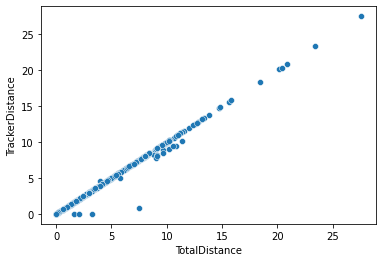

In [13]:
sns.scatterplot(x='TotalDistance',y='TrackerDistance',data=df1)

In [14]:
# dropping the trackerdistance column as it has same values as Total distance columns
df1.drop('TrackerDistance',axis =1)

,Id,ActivityDate,TotalSteps,TotalDistance,LoggedActivitiesDistance,VeryActiveDistance,ModeratelyActiveDistance,LightActiveDistance,SedentaryActiveDistance,VeryActiveMinutes,FairlyActiveMinutes,LightlyActiveMinutes,SedentaryMinutes,Calories,year,month,date
0,1503960366,3/25/2016,11004,7.110000,0.0,2.57,0.46,4.07,0.00,33,12,205,804,1819,2016,3,25
1,1503960366,3/26/2016,17609,11.550000,0.0,6.92,0.73,3.91,0.00,89,17,274,588,2154,2016,3,26
2,1503960366,3/27/2016,12736,8.530000,0.0,4.66,0.16,3.71,0.00,56,5,268,605,1944,2016,3,27
3,1503960366,3/28/2016,13231,8.930000,0.0,3.19,0.79,4.95,0.00,39,20,224,1080,1932,2016,3,28
4,1503960366,3/29/2016,12041,7.850000,0.0,2.16,1.09,4.61,0.00,28,28,243,763,1886,2016,3,29
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
452,8877689391,4/8/2016,23014,20.389999,0.0,11.10,0.63,8.62,0.00,70,29,359,982,4196,2016,4,8
453,8877689391,4/9/2016,16470,8.070000,0.0,0.00,0.02,8.02,0.00,90,9,289,1052,3841,2016,4,9
454,8877689391,4/10/2016,28497,27.530001,0.0,21.92,1.12,4.46,0.00,128,46,211,1055,4526,2016,4,10
455,8877689391,4/11/2016,10622,8.060000,0.0,1.47,0.15,6.37,0.01,18,7,225,1190,2820,2016,4,11


Text(0.5, 1.0, 'Box plot of calories burned as per day of the month')

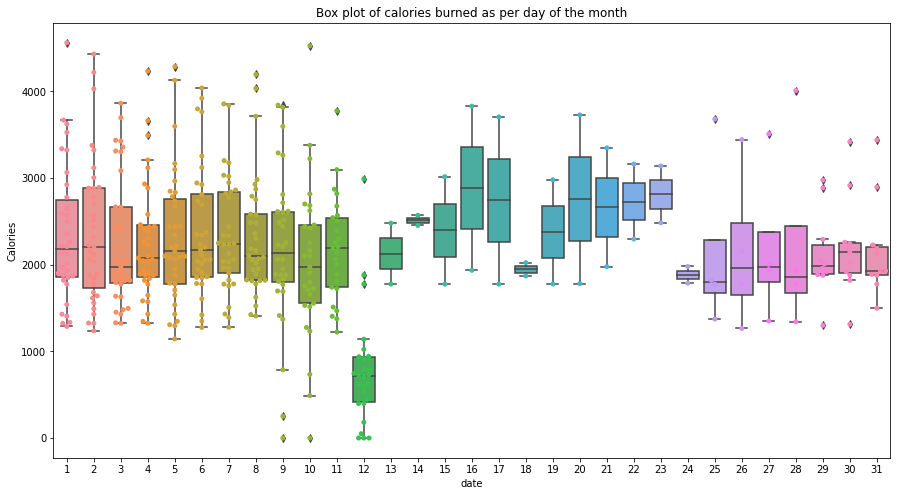

In [15]:
# plotting box plot to check the distribution of Calories burned as per date
plt.figure(figsize=(15,8))
ax = sns.boxplot(x='date',y='Calories',data=df1)
ax = sns.swarmplot(x='date',y='Calories',data=df1)
ax.set_title('Box plot of calories burned as per day of the month')

We can observe that the person has burned close to 2000 or above calories on most of the days in a month

In [16]:
df1.head()

,Id,ActivityDate,TotalSteps,TotalDistance,TrackerDistance,LoggedActivitiesDistance,VeryActiveDistance,ModeratelyActiveDistance,LightActiveDistance,SedentaryActiveDistance,VeryActiveMinutes,FairlyActiveMinutes,LightlyActiveMinutes,SedentaryMinutes,Calories,year,month,date
0,1503960366,3/25/2016,11004,7.11,7.11,0.0,2.57,0.46,4.07,0.0,33,12,205,804,1819,2016,3,25
1,1503960366,3/26/2016,17609,11.55,11.55,0.0,6.92,0.73,3.91,0.0,89,17,274,588,2154,2016,3,26
2,1503960366,3/27/2016,12736,8.53,8.53,0.0,4.66,0.16,3.71,0.0,56,5,268,605,1944,2016,3,27
3,1503960366,3/28/2016,13231,8.93,8.93,0.0,3.19,0.79,4.95,0.0,39,20,224,1080,1932,2016,3,28
4,1503960366,3/29/2016,12041,7.85,7.85,0.0,2.16,1.09,4.61,0.0,28,28,243,763,1886,2016,3,29


In [20]:
# converting the ActivityDate column to datetime
df1['ActivityDate'] = pd.to_datetime(df1['ActivityDate'])

In [28]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 457 entries, 0 to 456
Data columns (total 18 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   Id                        457 non-null    int64         
 1   ActivityDate              457 non-null    datetime64[ns]
 2   TotalSteps                457 non-null    int64         
 3   TotalDistance             457 non-null    float64       
 4   TrackerDistance           457 non-null    float64       
 5   LoggedActivitiesDistance  457 non-null    float64       
 6   VeryActiveDistance        457 non-null    float64       
 7   ModeratelyActiveDistance  457 non-null    float64       
 8   LightActiveDistance       457 non-null    float64       
 9   SedentaryActiveDistance   457 non-null    float64       
 10  VeryActiveMinutes         457 non-null    int64         
 11  FairlyActiveMinutes       457 non-null    int64         
 12  LightlyActiveMinutes  

In [27]:
df1['ActivityDate'].dtype

dtype('<M8[ns]')

In [34]:
df1['weekday'] = df1['ActivityDate'].dt.day_name()
df1.head()

,Id,ActivityDate,TotalSteps,TotalDistance,TrackerDistance,LoggedActivitiesDistance,VeryActiveDistance,ModeratelyActiveDistance,LightActiveDistance,SedentaryActiveDistance,VeryActiveMinutes,FairlyActiveMinutes,LightlyActiveMinutes,SedentaryMinutes,Calories,year,month,date,weekday
0,1503960366,2016-03-25,11004,7.11,7.11,0.0,2.57,0.46,4.07,0.0,33,12,205,804,1819,2016,3,25,Friday
1,1503960366,2016-03-26,17609,11.55,11.55,0.0,6.92,0.73,3.91,0.0,89,17,274,588,2154,2016,3,26,Saturday
2,1503960366,2016-03-27,12736,8.53,8.53,0.0,4.66,0.16,3.71,0.0,56,5,268,605,1944,2016,3,27,Sunday
3,1503960366,2016-03-28,13231,8.93,8.93,0.0,3.19,0.79,4.95,0.0,39,20,224,1080,1932,2016,3,28,Monday
4,1503960366,2016-03-29,12041,7.85,7.85,0.0,2.16,1.09,4.61,0.0,28,28,243,763,1886,2016,3,29,Tuesday


In [35]:
df1['Year'] = df1['ActivityDate'].dt.year

In [36]:
df1.head()

,Id,ActivityDate,TotalSteps,TotalDistance,TrackerDistance,LoggedActivitiesDistance,VeryActiveDistance,ModeratelyActiveDistance,LightActiveDistance,SedentaryActiveDistance,VeryActiveMinutes,FairlyActiveMinutes,LightlyActiveMinutes,SedentaryMinutes,Calories,year,month,date,weekday,Year
0,1503960366,2016-03-25,11004,7.11,7.11,0.0,2.57,0.46,4.07,0.0,33,12,205,804,1819,2016,3,25,Friday,2016
1,1503960366,2016-03-26,17609,11.55,11.55,0.0,6.92,0.73,3.91,0.0,89,17,274,588,2154,2016,3,26,Saturday,2016
2,1503960366,2016-03-27,12736,8.53,8.53,0.0,4.66,0.16,3.71,0.0,56,5,268,605,1944,2016,3,27,Sunday,2016
3,1503960366,2016-03-28,13231,8.93,8.93,0.0,3.19,0.79,4.95,0.0,39,20,224,1080,1932,2016,3,28,Monday,2016
4,1503960366,2016-03-29,12041,7.85,7.85,0.0,2.16,1.09,4.61,0.0,28,28,243,763,1886,2016,3,29,Tuesday,2016


<AxesSubplot:xlabel='weekday', ylabel='Calories'>

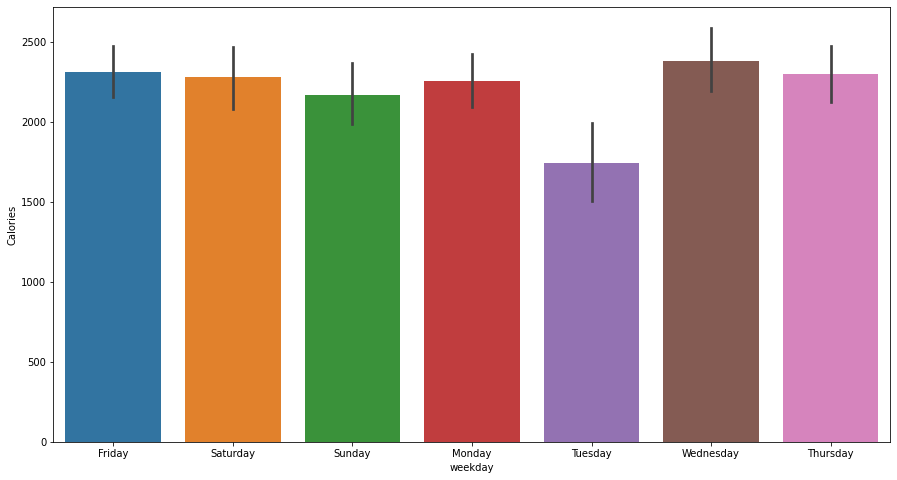

In [37]:
plt.figure(figsize=(15,8))
sns.barplot(x='weekday',y='Calories',data=df1)

It looks like he is more active and energetic on every wednesday of a week as he burned more calories

Text(0.5, 1.0, 'Scatterplot of calories and intense_activities')

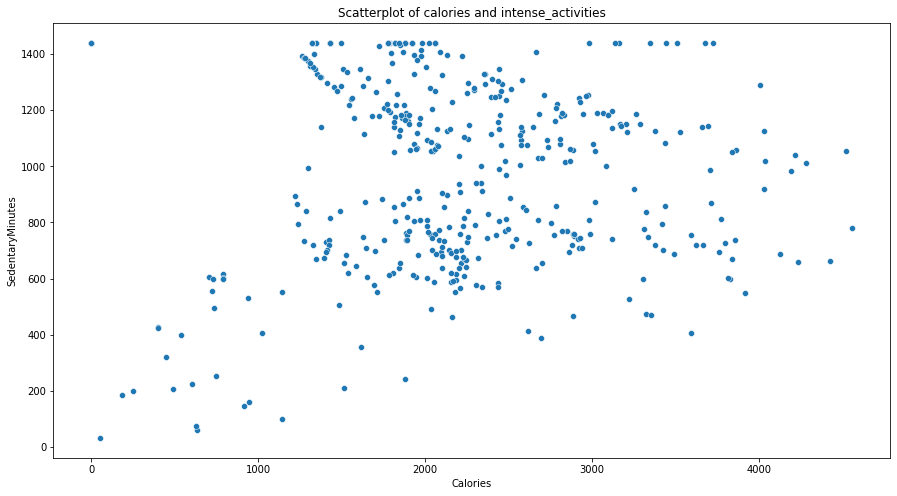

In [39]:
plt.figure(figsize=(15,8))

ax = sns.scatterplot(x='Calories',y='SedentaryMinutes',data=df1)
ax.set_title('Scatterplot of calories and intense_activities')

Sitting or lying down, (with the exception of sleeping), are what we call 'sedentary' behaviours. You can be sedentary at work, at school, at home, when travelling or during leisure time. Sedentary behaviour requires little energy expenditure

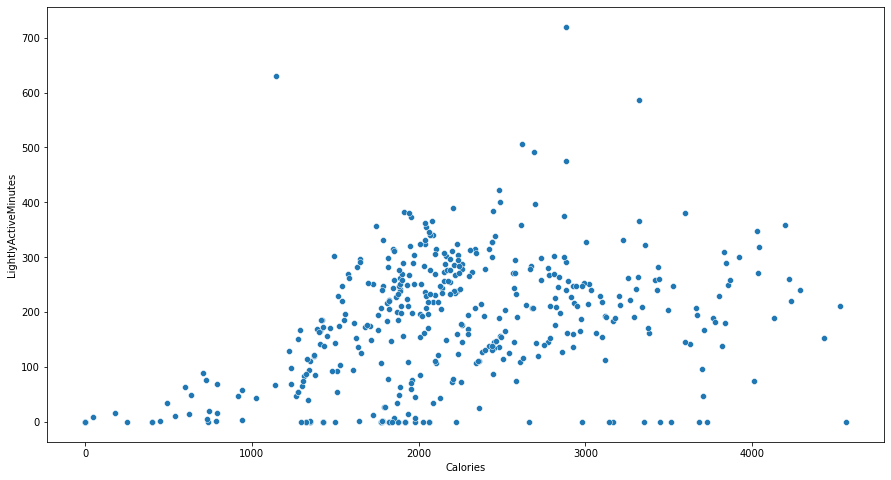

In [40]:
plt.figure(figsize=(15,8))

ax = sns.scatterplot(x='Calories',y='LightlyActiveMinutes',data=df1)

Text(0.5, 1.0, 'Scatterplot of calories vs Fairly Active Minutes')

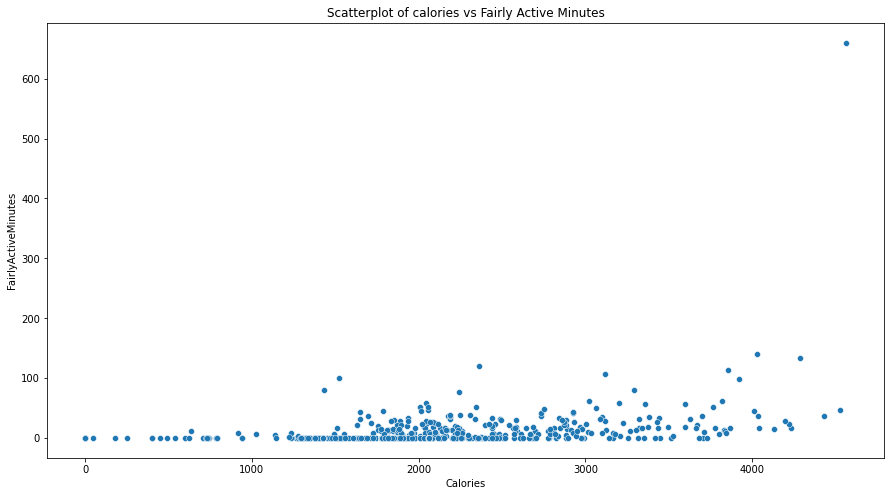

In [42]:
# figure size
plt.figure(figsize=(15,8))

# Simple scatterplot between calories burnt in the moderately active minutes
ax = sns.scatterplot(x='Calories', y='FairlyActiveMinutes', data=df1)

ax.set_title('Scatterplot of calories vs Fairly Active Minutes')

Text(0.5, 1.0, 'Scatterplot of calories and intense_activities')

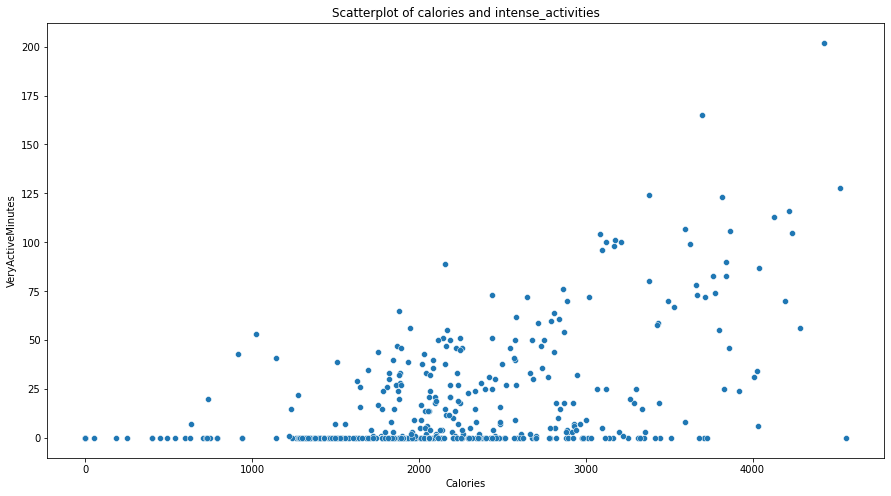

In [44]:
# figure size
plt.figure(figsize=(15,8))

# Simple scatterplot between calories burnt in the intensely active minutes
ax = sns.scatterplot(x='Calories', y='VeryActiveMinutes', data=df1)

ax.set_title('Scatterplot of calories and intense_activities')

In [45]:
df1.head()

,Id,ActivityDate,TotalSteps,TotalDistance,TrackerDistance,LoggedActivitiesDistance,VeryActiveDistance,ModeratelyActiveDistance,LightActiveDistance,SedentaryActiveDistance,VeryActiveMinutes,FairlyActiveMinutes,LightlyActiveMinutes,SedentaryMinutes,Calories,year,month,date,weekday,Year
0,1503960366,2016-03-25,11004,7.11,7.11,0.0,2.57,0.46,4.07,0.0,33,12,205,804,1819,2016,3,25,Friday,2016
1,1503960366,2016-03-26,17609,11.55,11.55,0.0,6.92,0.73,3.91,0.0,89,17,274,588,2154,2016,3,26,Saturday,2016
2,1503960366,2016-03-27,12736,8.53,8.53,0.0,4.66,0.16,3.71,0.0,56,5,268,605,1944,2016,3,27,Sunday,2016
3,1503960366,2016-03-28,13231,8.93,8.93,0.0,3.19,0.79,4.95,0.0,39,20,224,1080,1932,2016,3,28,Monday,2016
4,1503960366,2016-03-29,12041,7.85,7.85,0.0,2.16,1.09,4.61,0.0,28,28,243,763,1886,2016,3,29,Tuesday,2016


In [46]:
df1.columns

Index(['Id', 'ActivityDate', 'TotalSteps', 'TotalDistance', 'TrackerDistance',
       'LoggedActivitiesDistance', 'VeryActiveDistance',
       'ModeratelyActiveDistance', 'LightActiveDistance',
       'SedentaryActiveDistance', 'VeryActiveMinutes', 'FairlyActiveMinutes',
       'LightlyActiveMinutes', 'SedentaryMinutes', 'Calories', 'year', 'month',
       'date', 'weekday', 'Year'],
      dtype='object')

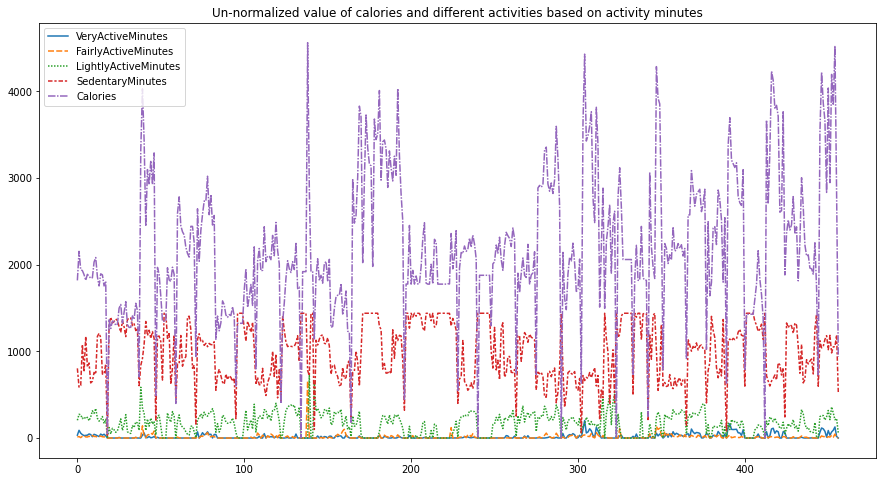

In [51]:
#line plot of all different time spent 
col_select = ['VeryActiveMinutes', 'FairlyActiveMinutes',
       'LightlyActiveMinutes', 'SedentaryMinutes','Calories']
df2 = df1[col_select]
plt.figure(figsize=(15,8))
ax = sns.lineplot(data=df2)

ax= ax.set_title('Un-normalized value of calories and different activities based on activity minutes')

Text(0.5, 1.0, 'Calorie vs Intensed activity')

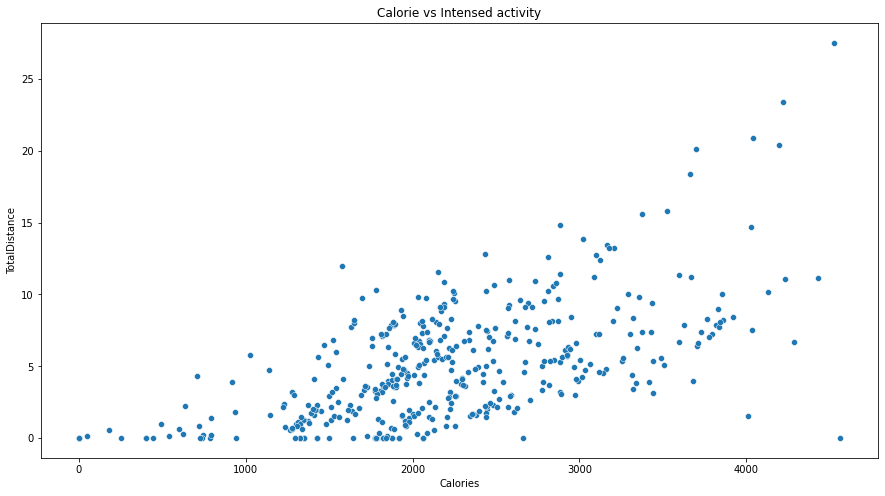

In [52]:
plt.figure(figsize=(15,8))
ax = sns.scatterplot(x='Calories',y='TotalDistance',data=df1)
ax.set_title('Calorie vs Intensed activity')

Distance and Calories burned are welly correlated 

Text(0.5, 1.0, 'Calorie vs Intensed activity')

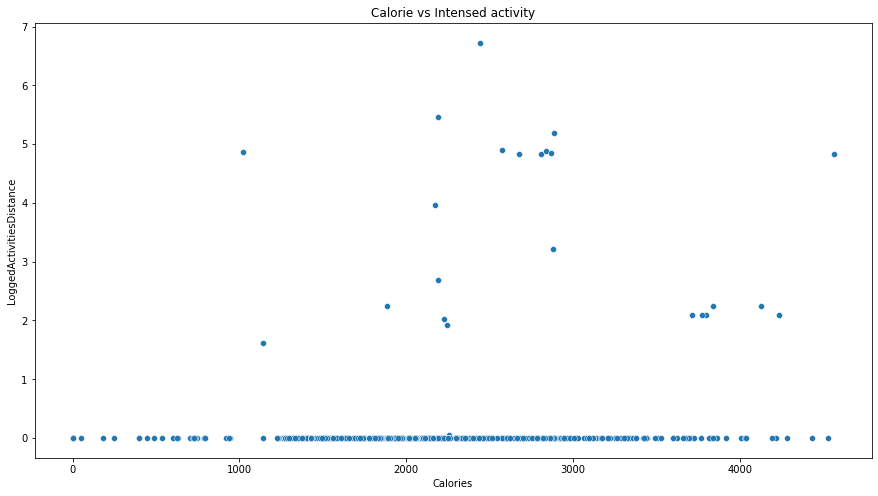

In [53]:
plt.figure(figsize=(15,8))
ax = sns.scatterplot(x='Calories',y='LoggedActivitiesDistance',data=df1)
ax.set_title('Calorie vs Intensed activity')

Text(0.5, 1.0, 'Scatterplot of calories and intense_activities')

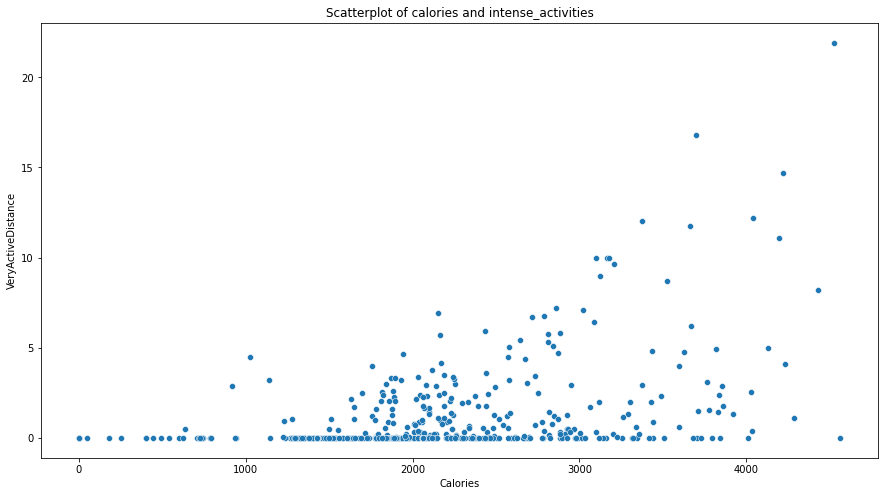

In [55]:
# figure size
plt.figure(figsize=(15,8))

# Simple scatterplot between calories burnt and the distance of intense activies
ax = sns.scatterplot(x='Calories', y='VeryActiveDistance', data=df1)

ax.set_title('Scatterplot of calories and intense_activities')

Text(0.5, 1.0, 'Scatterplot of calories and intense_activities')

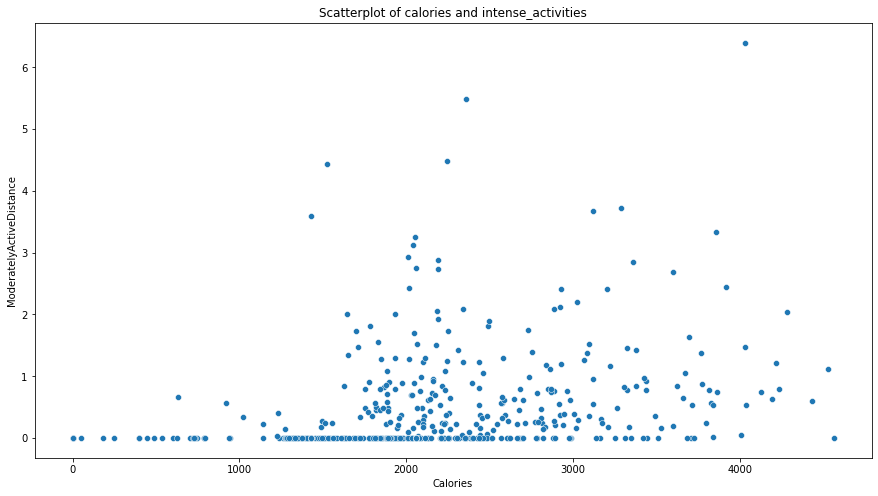

In [56]:
# figure size
plt.figure(figsize=(15,8))

# Simple scatterplot between calories burnt and the distance of moderate activies
ax = sns.scatterplot(x='Calories', y='ModeratelyActiveDistance', data=df1)

ax.set_title('Scatterplot of calories and intense_activities')

Text(0.5, 1.0, 'Scatterplot of calories and intense_activities')

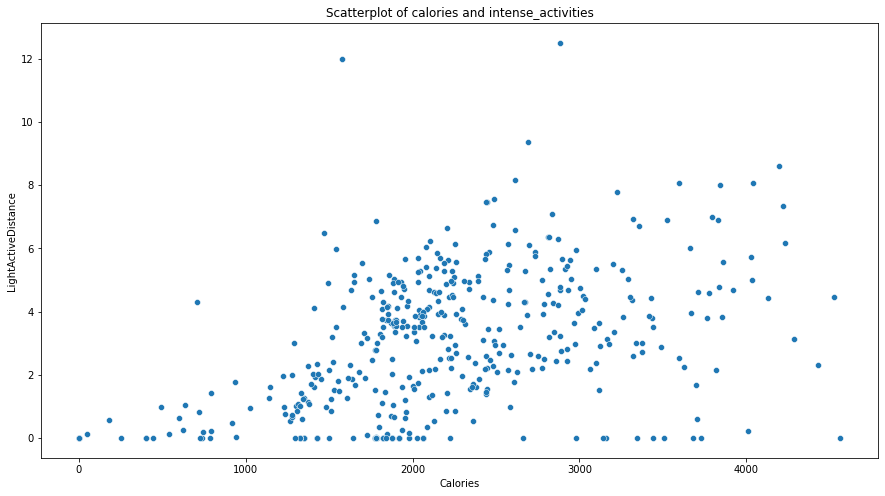

In [57]:
# figure size
plt.figure(figsize=(15,8))

# Simple scatterplot
ax = sns.scatterplot(x='Calories', y='LightActiveDistance', data=df1)

ax.set_title('Scatterplot of calories and intense_activities')

Text(0.5, 1.0, 'Un-normalized value of calories and different activities based on distance')

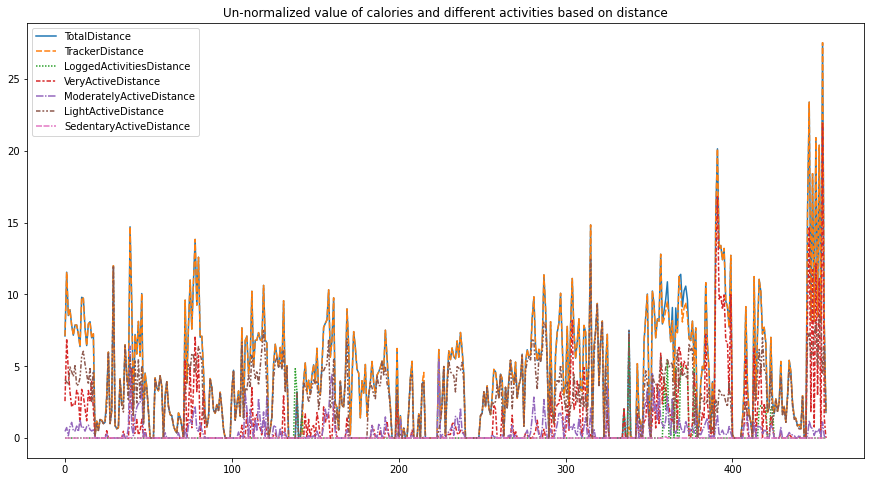

In [58]:
#plotting the line plot of raw data
col_select = ['TotalDistance', 'TrackerDistance',
       'LoggedActivitiesDistance', 'VeryActiveDistance',
       'ModeratelyActiveDistance', 'LightActiveDistance',
       'SedentaryActiveDistance']
df3= df1[col_select]

plt.figure(figsize=(15,8))
ax = sns.lineplot(data=df3)
ax.set_title('Un-normalized value of calories and different activities based on distance')

The  EDA here gives us the insight about the relation between the active hours, the distance for which the user has moderate and intense activity and the calories burnt during that period. 